In [1]:
### Importing the required libraries
import numpy as np
import pandas as pd

#Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

#Train-Test Split
from sklearn.model_selection import train_test_split

#For Normalization
from sklearn.preprocessing import StandardScaler

# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

#Importing variance_inflation_factor
from statsmodels.stats.outliers_influence import variance_inflation_factor

#Importing Stats Model for model building
import statsmodels.api as sm

#Importing r2_score
from sklearn.metrics import r2_score

#Specifying all columns to be shown
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 80)

In [2]:
#Reading train dataset
house_df = pd.read_csv('house_train.csv')
house_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,30,RL,63.0,13907,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1940,1969,Gable,CompShg,WdShing,Wd Shng,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,290,Unf,0,706,996,GasA,Ex,Y,SBrkr,996,0,0,996,1,0,1,0,3,1,TA,6,Typ,1,Gd,NaN,NaN,NaN,0,0,NaN,NaN,Y,144,0,0,0,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal,108000
1,1,50,RL,78.0,11344,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1.5Fin,5,5,1958,1958,Gable,CompShg,MetalSd,MetalSd,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,BLQ,460,Unf,0,414,874,GasW,TA,Y,FuseA,874,650,0,1524,0,0,1,1,3,1,TA,7,Typ,0,NaN,Attchd,1958.0,Unf,1,315,TA,TA,Y,0,0,0,0,0,0,NaN,GdWo,NaN,0,7,2007,WD,Normal,144000
2,2,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
3,3,190,RM,60.0,11340,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,6,1885,1950,Gable,CompShg,VinylSd,AsbShng,None,0.0,TA,TA,PConc,TA,TA,No,Unf,0,Unf,0,777,777,GasA,Gd,Y,SBrkr,1246,1044,0,2290,0,0,2,0,4,2,TA,11,Typ,0,NaN,Detchd,1971.0,Unf,2,560,TA,TA,N,0,0,114,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,122500
4,4,60,RL,76.0,9591,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,344.0,Gd,TA,PConc,Ex,TA,Av,Unf,0,Unf,0,1143,1143,GasA,Ex,Y,SBrkr,1143,1330,0,2473,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2004.0,RFn,3,852,TA,TA,Y,192,151,0,0,0,0,NaN,NaN,NaN,0,10,2007,WD,Normal,317000


In [3]:
#dropping id column
house_df.drop('Id',axis=1,inplace=True)
house_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,30,RL,63.0,13907,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1940,1969,Gable,CompShg,WdShing,Wd Shng,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,290,Unf,0,706,996,GasA,Ex,Y,SBrkr,996,0,0,996,1,0,1,0,3,1,TA,6,Typ,1,Gd,NaN,NaN,NaN,0,0,NaN,NaN,Y,144,0,0,0,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal,108000
1,50,RL,78.0,11344,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1.5Fin,5,5,1958,1958,Gable,CompShg,MetalSd,MetalSd,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,BLQ,460,Unf,0,414,874,GasW,TA,Y,FuseA,874,650,0,1524,0,0,1,1,3,1,TA,7,Typ,0,NaN,Attchd,1958.0,Unf,1,315,TA,TA,Y,0,0,0,0,0,0,NaN,GdWo,NaN,0,7,2007,WD,Normal,144000
2,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
3,190,RM,60.0,11340,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,6,1885,1950,Gable,CompShg,VinylSd,AsbShng,None,0.0,TA,TA,PConc,TA,TA,No,Unf,0,Unf,0,777,777,GasA,Gd,Y,SBrkr,1246,1044,0,2290,0,0,2,0,4,2,TA,11,Typ,0,NaN,Detchd,1971.0,Unf,2,560,TA,TA,N,0,0,114,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,122500
4,60,RL,76.0,9591,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,344.0,Gd,TA,PConc,Ex,TA,Av,Unf,0,Unf,0,1143,1143,GasA,Ex,Y,SBrkr,1143,1330,0,2473,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2004.0,RFn,3,852,TA,TA,Y,192,151,0,0,0,0,NaN,NaN,NaN,0,10,2007,WD,Normal,317000


In [4]:
house_df.shape


(1168, 80)

In [5]:
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1168 non-null   int64  
 1   MSZoning       1168 non-null   object 
 2   LotFrontage    982 non-null    float64
 3   LotArea        1168 non-null   int64  
 4   Street         1168 non-null   object 
 5   Alley          74 non-null     object 
 6   LotShape       1168 non-null   object 
 7   LandContour    1168 non-null   object 
 8   Utilities      1168 non-null   object 
 9   LotConfig      1168 non-null   object 
 10  LandSlope      1168 non-null   object 
 11  Neighborhood   1168 non-null   object 
 12  Condition1     1168 non-null   object 
 13  Condition2     1168 non-null   object 
 14  BldgType       1168 non-null   object 
 15  HouseStyle     1168 non-null   object 
 16  OverallQual    1168 non-null   int64  
 17  OverallCond    1168 non-null   int64  
 18  YearBuil

In [6]:
house_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,982.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1103.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,57.251712,70.092668,10571.564212,6.106164,5.624144,1970.900685,1984.759418,104.009475,437.525685,44.419521,571.046233,1052.991438,1159.699486,347.994863,6.411815,1514.106164,0.412671,0.063356,1.563356,0.379281,2.871575,1.050514,6.511130,0.613870,1978.067090,1.760274,469.684075,94.175514,46.369863,22.380137,2.880993,16.201199,1.342466,45.542808,6.357877,2007.797945,180657.954623
std,42.189213,24.737533,10543.102521,1.356326,1.129946,30.138647,20.782577,181.134311,455.613166,154.643046,442.216565,434.697436,383.032984,437.325344,51.781451,524.379961,0.519617,0.250640,0.554881,0.504460,0.822111,0.230531,1.629278,0.649867,24.950751,0.747963,213.714371,124.439546,65.718768,61.711808,24.712303,57.452784,26.543444,545.527199,2.679448,1.328069,77261.558314
min,20.000000,21.000000,1300.000000,2.000000,2.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,0.000000,438.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7487.250000,5.000000,5.000000,1953.000000,1966.000000,0.000000,0.000000,0.000000,224.000000,798.000000,879.750000,0.000000,0.000000,1128.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1960.000000,1.000000,323.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,50.000000,69.000000,9355.000000,6.000000,5.000000,1972.000000,1994.000000,0.000000,377.500000,0.000000,484.500000,980.000000,1080.000000,0.000000,0.000000,1470.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1979.000000,2.000000,475.000000,0.000000,25.500000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163500.000000
75%,70.000000,80.000000,11530.000000,7.000000,6.000000,2000.250000,2004.000000,168.000000,699.250000,0.000000,812.250000,1300.500000,1389.500000,730.500000,0.000000,1771.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2009.000000,2010.000000,1600.000000,5644.000000,1127.000000,2336.000000,6110.000000,4692.000000,1872.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,320.000000,480.000000,576.000000,15500.000000,12.000000,2010.000000,755000.000000


**Observation:** Count of each column is not equal to total number of rows and some columns have huge variation between 75% percentile and max value. Hence, data has missing values and outliers.

In [7]:
#Checking percentage of missing values
100*house_df.isnull().mean().sort_values(ascending=False)

PoolQC           99.743151
MiscFeature      96.575342
Alley            93.664384
Fence            80.993151
FireplaceQu      47.431507
LotFrontage      15.924658
GarageCond        5.565068
GarageQual        5.565068
GarageType        5.565068
GarageFinish      5.565068
GarageYrBlt       5.565068
BsmtExposure      2.910959
BsmtQual          2.825342
BsmtCond          2.825342
BsmtFinType2      2.825342
BsmtFinType1      2.825342
MasVnrType        0.599315
MasVnrArea        0.599315
MSSubClass        0.000000
Fireplaces        0.000000
TotRmsAbvGrd      0.000000
KitchenQual       0.000000
KitchenAbvGr      0.000000
BedroomAbvGr      0.000000
HalfBath          0.000000
FullBath          0.000000
BsmtHalfBath      0.000000
Functional        0.000000
GarageCars        0.000000
GrLivArea         0.000000
GarageArea        0.000000
PavedDrive        0.000000
WoodDeckSF        0.000000
OpenPorchSF       0.000000
EnclosedPorch     0.000000
3SsnPorch         0.000000
ScreenPorch       0.000000
P

In [8]:
#Fetching columns having > 40% missing values
miss_col_df = house_df.isnull().mean().reset_index()
miss_col_df[0] = miss_col_df[0]*100
miss_col_df = miss_col_df.rename(columns={"index":"Column Name", 0:"Missing Value(%)"})
miss_col_df = miss_col_df.sort_values(by=["Missing Value(%)"],ascending=False)
cols_to_drop = list(miss_col_df[miss_col_df["Missing Value(%)"]>40]["Column Name"])
cols_to_drop

['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu']

In [9]:
house_df.drop(cols_to_drop, axis=1,inplace=True)
100*house_df.isnull().mean().sort_values(ascending=False)

LotFrontage      15.924658
GarageYrBlt       5.565068
GarageType        5.565068
GarageFinish      5.565068
GarageQual        5.565068
GarageCond        5.565068
BsmtExposure      2.910959
BsmtQual          2.825342
BsmtCond          2.825342
BsmtFinType1      2.825342
BsmtFinType2      2.825342
MasVnrType        0.599315
MasVnrArea        0.599315
KitchenAbvGr      0.000000
BedroomAbvGr      0.000000
HalfBath          0.000000
FullBath          0.000000
BsmtHalfBath      0.000000
KitchenQual       0.000000
TotRmsAbvGrd      0.000000
BsmtFullBath      0.000000
Functional        0.000000
GrLivArea         0.000000
MSSubClass        0.000000
Fireplaces        0.000000
ScreenPorch       0.000000
SaleCondition     0.000000
SaleType          0.000000
YrSold            0.000000
MoSold            0.000000
MiscVal           0.000000
PoolArea          0.000000
3SsnPorch         0.000000
2ndFlrSF          0.000000
EnclosedPorch     0.000000
OpenPorchSF       0.000000
WoodDeckSF        0.000000
P

In [10]:
#List of columns remaining with missing values
miss_col_df = house_df.isnull().mean().reset_index()
miss_col_df[0] = miss_col_df[0]*100
miss_col_df = miss_col_df.rename(columns={"index":"Column Name", 0:"Missing Value(%)"})
miss_col_df = miss_col_df.sort_values(by=["Missing Value(%)"],ascending=False)
cols_to_fix = list(miss_col_df[miss_col_df["Missing Value(%)"]>0]["Column Name"])
cols_to_fix

['LotFrontage',
 'GarageYrBlt',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'BsmtExposure',
 'BsmtQual',
 'BsmtCond',
 'BsmtFinType1',
 'BsmtFinType2',
 'MasVnrType',
 'MasVnrArea']

In [11]:
house_df[cols_to_fix].dtypes

LotFrontage     float64
GarageYrBlt     float64
GarageType       object
GarageFinish     object
GarageQual       object
GarageCond       object
BsmtExposure     object
BsmtQual         object
BsmtCond         object
BsmtFinType1     object
BsmtFinType2     object
MasVnrType       object
MasVnrArea      float64
dtype: object

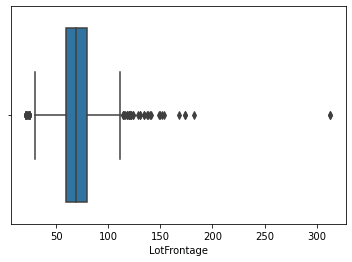

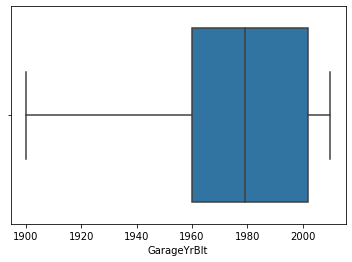

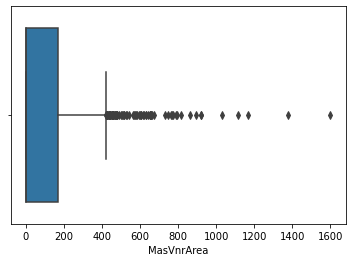

In [12]:
cols=   ['LotFrontage','GarageYrBlt','MasVnrArea']
for i in cols:
    sns.boxplot(house_df[i])
    plt.show()

In [13]:
#Using median to replace missing values for variables having outliers and mean for GarageYrBlt as it doesnt have outliers
for i in ['LotFrontage','MasVnrArea']:
    house_df[i] = house_df[i].replace(np.nan, house_df[i].median())  
house_df['GarageYrBlt'] = house_df['GarageYrBlt'].replace(np.nan, house_df['GarageYrBlt'].mean())   
100*house_df.isnull().mean().sort_values(ascending=False)

GarageType       5.565068
GarageCond       5.565068
GarageFinish     5.565068
GarageQual       5.565068
BsmtExposure     2.910959
BsmtFinType2     2.825342
BsmtFinType1     2.825342
BsmtCond         2.825342
BsmtQual         2.825342
MasVnrType       0.599315
BsmtHalfBath     0.000000
FullBath         0.000000
HalfBath         0.000000
Functional       0.000000
BedroomAbvGr     0.000000
BsmtFullBath     0.000000
GrLivArea        0.000000
KitchenAbvGr     0.000000
KitchenQual      0.000000
LowQualFinSF     0.000000
TotRmsAbvGrd     0.000000
MSSubClass       0.000000
Fireplaces       0.000000
1stFlrSF         0.000000
SaleCondition    0.000000
SaleType         0.000000
YrSold           0.000000
MoSold           0.000000
MiscVal          0.000000
PoolArea         0.000000
ScreenPorch      0.000000
3SsnPorch        0.000000
EnclosedPorch    0.000000
OpenPorchSF      0.000000
WoodDeckSF       0.000000
PavedDrive       0.000000
GarageArea       0.000000
GarageCars       0.000000
GarageYrBlt 

In [14]:
#replacing missing values for categorical variables with mode
for i in ['GarageType','GarageFinish','GarageQual', 'GarageCond', 'BsmtExposure', 'BsmtQual', 'BsmtCond', 'BsmtFinType1', 'BsmtFinType2', 'MasVnrType']:
    house_df[i].fillna(house_df[i].mode()[0],inplace=True)         
100*house_df.isnull().mean().sort_values(ascending=False)

MSSubClass       0.0
GarageYrBlt      0.0
Fireplaces       0.0
Functional       0.0
TotRmsAbvGrd     0.0
KitchenQual      0.0
KitchenAbvGr     0.0
BedroomAbvGr     0.0
HalfBath         0.0
FullBath         0.0
BsmtHalfBath     0.0
BsmtFullBath     0.0
GrLivArea        0.0
LowQualFinSF     0.0
2ndFlrSF         0.0
1stFlrSF         0.0
Electrical       0.0
GarageType       0.0
GarageFinish     0.0
HeatingQC        0.0
GarageCars       0.0
SaleCondition    0.0
SaleType         0.0
YrSold           0.0
MoSold           0.0
MiscVal          0.0
PoolArea         0.0
ScreenPorch      0.0
3SsnPorch        0.0
EnclosedPorch    0.0
OpenPorchSF      0.0
WoodDeckSF       0.0
PavedDrive       0.0
GarageCond       0.0
GarageQual       0.0
GarageArea       0.0
CentralAir       0.0
Heating          0.0
MSZoning         0.0
YearRemodAdd     0.0
OverallCond      0.0
OverallQual      0.0
HouseStyle       0.0
BldgType         0.0
Condition2       0.0
Condition1       0.0
Neighborhood     0.0
LandSlope    

Feature Engineering

In [15]:
house_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,30,RL,63.0,13907,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1940,1969,Gable,CompShg,WdShing,Wd Shng,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,290,Unf,0,706,996,GasA,Ex,Y,SBrkr,996,0,0,996,1,0,1,0,3,1,TA,6,Typ,1,Attchd,1978.06709,Unf,0,0,TA,TA,Y,144,0,0,0,0,0,0,7,2008,WD,Normal,108000
1,50,RL,78.0,11344,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1.5Fin,5,5,1958,1958,Gable,CompShg,MetalSd,MetalSd,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,BLQ,460,Unf,0,414,874,GasW,TA,Y,FuseA,874,650,0,1524,0,0,1,1,3,1,TA,7,Typ,0,Attchd,1958.00000,Unf,1,315,TA,TA,Y,0,0,0,0,0,0,0,7,2007,WD,Normal,144000
2,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.00000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
3,190,RM,60.0,11340,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,6,1885,1950,Gable,CompShg,VinylSd,AsbShng,None,0.0,TA,TA,PConc,TA,TA,No,Unf,0,Unf,0,777,777,GasA,Gd,Y,SBrkr,1246,1044,0,2290,0,0,2,0,4,2,TA,11,Typ,0,Detchd,1971.00000,Unf,2,560,TA,TA,N,0,0,114,0,0,0,0,4,2010,WD,Normal,122500
4,60,RL,76.0,9591,Pave,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,344.0,Gd,TA,PConc,Ex,TA,Av,Unf,0,Unf,0,1143,1143,GasA,Ex,Y,SBrkr,1143,1330,0,2473,0,0,2,1,4,1,Gd,9,Typ,1,BuiltIn,2004.00000,RFn,3,852,TA,TA,Y,192,151,0,0,0,0,0,10,2007,WD,Normal,317000


In [16]:
#Creating another column with age of property at the time of sale using year remodel yr_sold
house_df['PropertyAgeAfterRemod'] = house_df['YrSold'] - house_df['YearRemodAdd']
house_df['PropertyAge'] = house_df['YrSold'] - house_df['YearBuilt']
house_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,PropertyAgeAfterRemod,PropertyAge
0,30,RL,63.0,13907,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1940,1969,Gable,CompShg,WdShing,Wd Shng,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,290,Unf,0,706,996,GasA,Ex,Y,SBrkr,996,0,0,996,1,0,1,0,3,1,TA,6,Typ,1,Attchd,1978.06709,Unf,0,0,TA,TA,Y,144,0,0,0,0,0,0,7,2008,WD,Normal,108000,39,68
1,50,RL,78.0,11344,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1.5Fin,5,5,1958,1958,Gable,CompShg,MetalSd,MetalSd,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,BLQ,460,Unf,0,414,874,GasW,TA,Y,FuseA,874,650,0,1524,0,0,1,1,3,1,TA,7,Typ,0,Attchd,1958.00000,Unf,1,315,TA,TA,Y,0,0,0,0,0,0,0,7,2007,WD,Normal,144000,49,49
2,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.00000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000,8,8
3,190,RM,60.0,11340,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,6,1885,1950,Gable,CompShg,VinylSd,AsbShng,None,0.0,TA,TA,PConc,TA,TA,No,Unf,0,Unf,0,777,777,GasA,Gd,Y,SBrkr,1246,1044,0,2290,0,0,2,0,4,2,TA,11,Typ,0,Detchd,1971.00000,Unf,2,560,TA,TA,N,0,0,114,0,0,0,0,4,2010,WD,Normal,122500,60,125
4,60,RL,76.0,9591,Pave,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,344.0,Gd,TA,PConc,Ex,TA,Av,Unf,0,Unf,0,1143,1143,GasA,Ex,Y,SBrkr,1143,1330,0,2473,0,0,2,1,4,1,Gd,9,Typ,1,BuiltIn,2004.00000,RFn,3,852,TA,TA,Y,192,151,0,0,0,0,0,10,2007,WD,Normal,317000,2,3


In [17]:
#dropping yrbuilt, yearemod and yrsold as property age is added
cols_to_be_removed = ['YearBuilt','YearRemodAdd','YrSold']

In [18]:
numeric_cols = ['MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','SalePrice','PropertyAge','PropertyAgeAfterRemod']                 
categorical_col = ['MSZoning','Street','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical','KitchenQual','Functional','GarageType','GarageFinish','GarageQual','GarageCond','PavedDrive','SaleType','SaleCondition']

In [19]:
#Checking for columns that have biased values or single values
for i in house_df.columns:
    temp = house_df[i].value_counts().reset_index()
    temp = temp[temp[i]*100/temp[i].sum() > 80]
    if(len(temp)>0):
        print(i)

Street
LandContour
Utilities
LandSlope
Condition1
Condition2
BldgType
RoofMatl
ExterCond
BsmtCond
BsmtFinType2
BsmtFinSF2
Heating
CentralAir
Electrical
LowQualFinSF
BsmtHalfBath
KitchenAbvGr
Functional
GarageQual
GarageCond
PavedDrive
EnclosedPorch
3SsnPorch
ScreenPorch
PoolArea
MiscVal
SaleType
SaleCondition


In [20]:
cols_to_be_removed = ['YearBuilt','YearRemodAdd','YrSold','BsmtFinSF2', 'LowQualFinSF','BsmtHalfBath','KitchenAbvGr','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','Street','LandContour','Utilities','LandSlope','Condition1','Condition2','BldgType','RoofMatl','ExterCond','BsmtCond','BsmtFinType2','Heating','CentralAir','Electrical','Functional','GarageQual','GarageCond','PavedDrive','SaleType','SaleCondition']

In [21]:
#Removing columns that have bias or single values
house_df.drop(cols_to_be_removed,axis=1,inplace=True)

In [22]:
house_df.shape

(1168, 45)

In [23]:
numeric_cols = ['MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtFullBath','FullBath','HalfBath','BedroomAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','MoSold','SalePrice','PropertyAge','PropertyAgeAfterRemod']
categorical_col = ['MSZoning','LotShape','LotConfig','Neighborhood','HouseStyle','RoofStyle','Exterior1st','Exterior2nd','MasVnrType','ExterQual','Foundation','BsmtQual','BsmtExposure','BsmtFinType1','HeatingQC','KitchenQual','GarageType','GarageFinish']

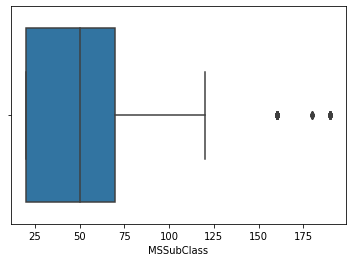

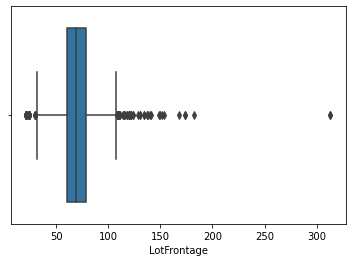

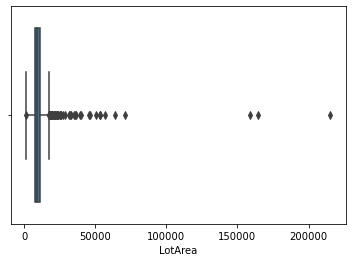

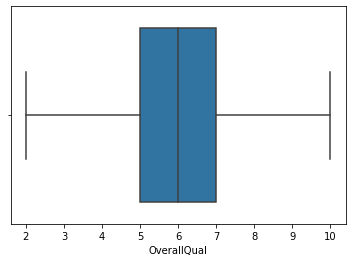

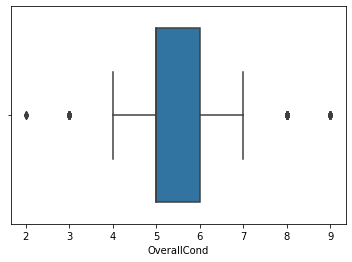

...

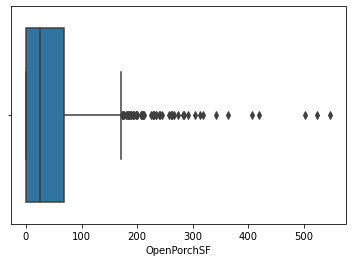

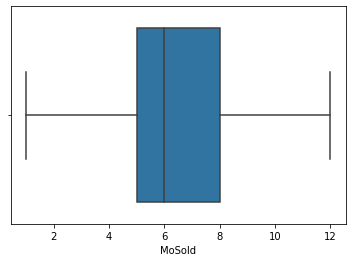

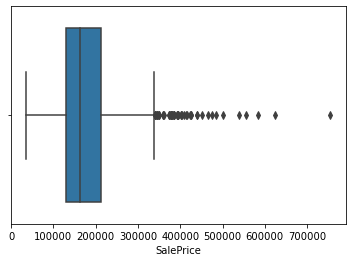

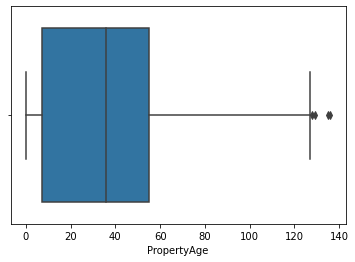

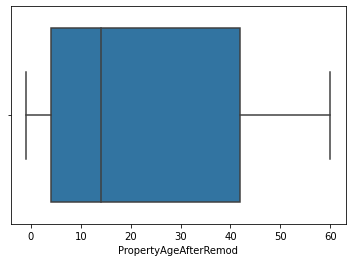

In [24]:
for i in numeric_cols:
    sns.boxplot(house_df[i])
    plt.show()

#Outliers seem reasonable   

**EDA**

In [25]:
#custom function for EDA
def draw_barchart(x):
    plt.bar(house_df[x],house_df['SalePrice'])
    plt.xlabel(x)
    plt.ylabel('SalePrice')
    plt.title('SalePrice V/S '+x)
    plt.show()

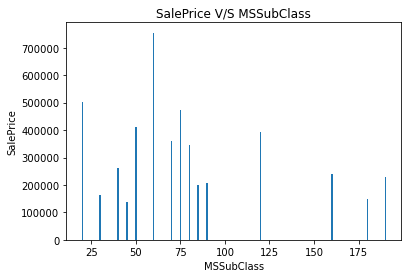

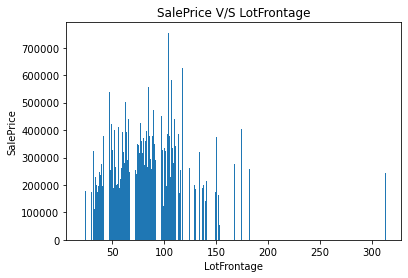

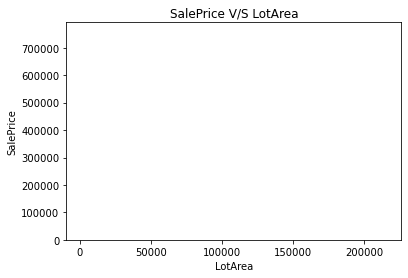

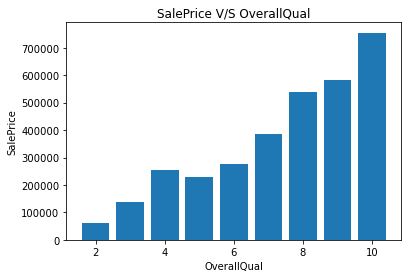

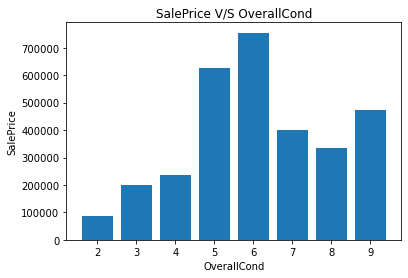

...

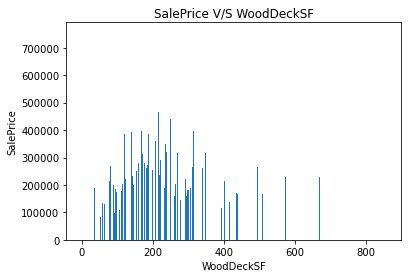

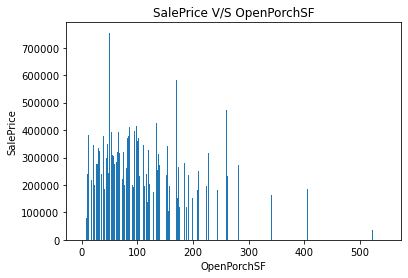

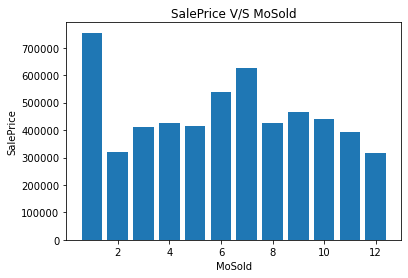

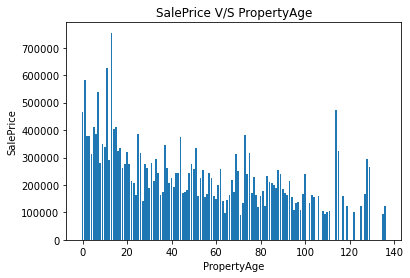

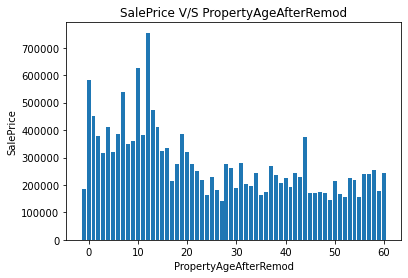

In [26]:
for i in numeric_cols:
    if i != 'SalePrice':
        draw_barchart(i)

**Oberservations:** Houses that meet the following criteria have seen higher total sale prices in each category:<br>
MSSubClass60 <br>
LotFrontage of 100 ft <br>
SalePrice has increasing trend with increase in OverallQual as expected.<br>
OverallCondition of 5-6 <br>
MasVnrArea of around 1100 sq feet<br>
BsmtFinSF1 of area around 1500 sqft<br>
BsmtUnfSF doesnt have much variation<br>
TotalBsmtSF of around 2000 sqft<br>
Sale price increases gradually with increase in 1stFlrSF<br>
2ndFlrSF has mixed tren with peak at around 900 sqft<br>
Saleprice increases with increase in GrLivArea<br>
0 Full bathrooms in basement<br>
3 Full bathrooms above grade <br>
1 half bathroom above grade<br>
4 bedrooms above ground <br>
10 rooms above ground<br>
2 fireplaces<br>
Saleprice increases gradually with GarageYrBlt until 1990 and then decreases<br>
Garage with space for 3 cars<br>
Saleprice increases gradually with GarageArea until 850 sqft and then decreases<br>
Lesser area of wooden deck with peak around 50 sq ft<br>
100-200 sqft of Open Porch<br>
Sold in month of January <br>
Properties having actual or after remodelled age upto 15 yrs<br>
Sale price decreases with increasing age of property as expected<br>

In [27]:
#analyzing lot area
100*house_df.LotArea.value_counts(normalize=True)

9600     1.883562
7200     1.797945
6000     1.369863
10800    1.027397
8400     0.856164
           ...   
7259     0.085616
10659    0.085616
7100     0.085616
6970     0.085616
17104    0.085616
Name: LotArea, Length: 883, dtype: float64

In [28]:
house_df.LotArea.describe()

count      1168.000000
mean      10571.564212
std       10543.102521
min        1300.000000
25%        7487.250000
50%        9355.000000
75%       11530.000000
max      215245.000000
Name: LotArea, dtype: float64

In [91]:
np.percentile(house_df.LotArea,99)

30000.0

In [30]:
#replacing outliers with 99th percentile
house_df.LotArea = house_df.LotArea.apply(lambda x: 41910.9799999996 if x > 41910.9799999996 else x)
house_df[house_df.LotArea > 41910.9799999996]

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,PropertyAgeAfterRemod,PropertyAge


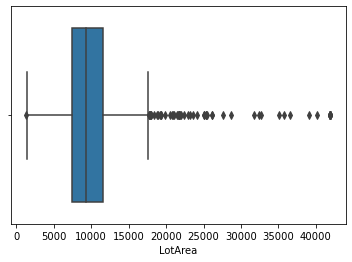

In [31]:
sns.boxplot(house_df.LotArea)
plt.show()

In [32]:
np.percentile(house_df.LotArea,99)

40693.60339999974

In [33]:
len(house_df[house_df.LotArea>30000]) #taking value closer to other major outliers

20

In [34]:
#replacing outliers with 99th percentile
house_df.LotArea = house_df.LotArea.apply(lambda x: 30000 if x > 30000 else x)
house_df[house_df.LotArea > 30000]

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,PropertyAgeAfterRemod,PropertyAge


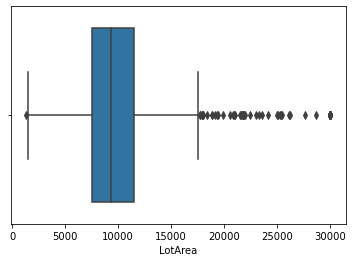

In [35]:
sns.boxplot(house_df.LotArea)
plt.show()

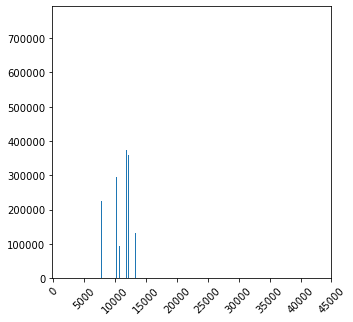

In [36]:
plt.figure(figsize=(5, 5))
plt.bar(house_df['LotArea'],house_df['SalePrice'])
listOf_Xticks = np.arange(0, 50000, 5000)
plt.xticks(listOf_Xticks,rotation='45')
plt.show()

#5000-10000 sqft has the highest total prices 

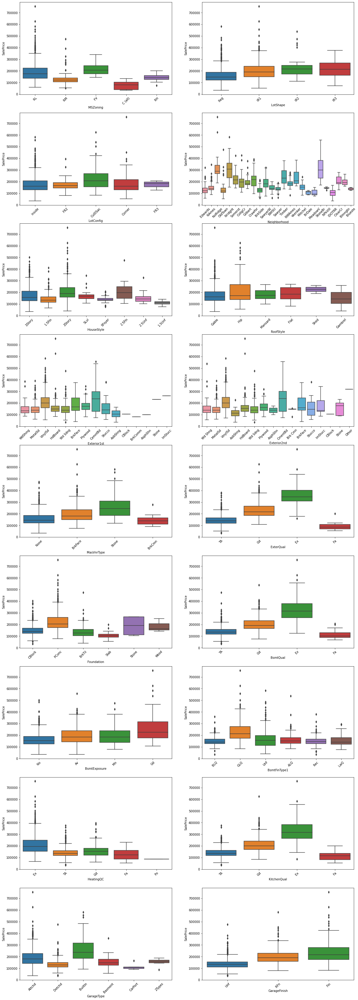

In [37]:
plt.figure(figsize=(20, 60))
for i,j in enumerate(categorical_col):
    plt.subplot(9,2,i+1)
    sns.boxplot(x = j, y = 'SalePrice', data = house_df)
    plt.xticks(rotation='45')
plt.show()


<b>Observation</b>:Houses meeting with following criteria have highest sale prices in terms of individual categories:<br>
MSZone: FV and RL<br>
LotShape: IR1,2 and 3<br> 
LotConfig: CulDSac<br>
Neighborhood: MeadowV<br>
HouseStyle: 2Story<br>
RoofStyle: Shed<br>
Exterior1st: CemntBd<br>
Exterior2nd: CemntBd<br>
MasVnrType: Stone<br>
ExterQual: Ex<br>
Foundation: PConc and Stone<br>
BsmtQual: Ex<br>
BsmtExposure: Gd<br>
BsmtFinType1: GLQ<br>
HeatingQC: Ex<br>
KitchenQual: Ex<br>
GarageType: BuiltIn<br>
GarageFinish: Fin<br>

<AxesSubplot:xlabel='MSZoning,Neighborhood'>

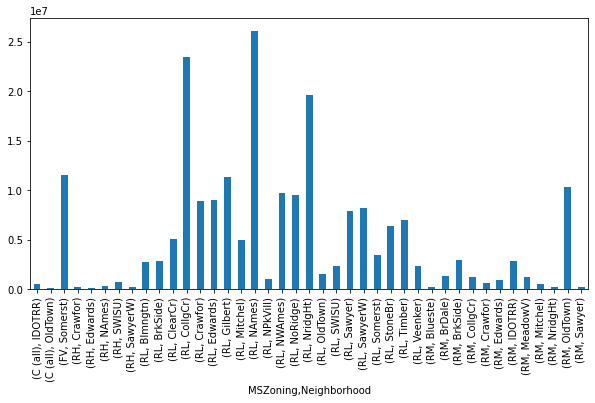

In [38]:
plt.figure(figsize=(10, 5))
house_df_zones = house_df[['Neighborhood','MSZoning','SalePrice']]
house_df_zones.groupby(['MSZoning','Neighborhood'])['SalePrice'].sum().plot.bar()

#Low Density Residential Areas have higher sale prices especially CollgCr, NAmes and NridgHt

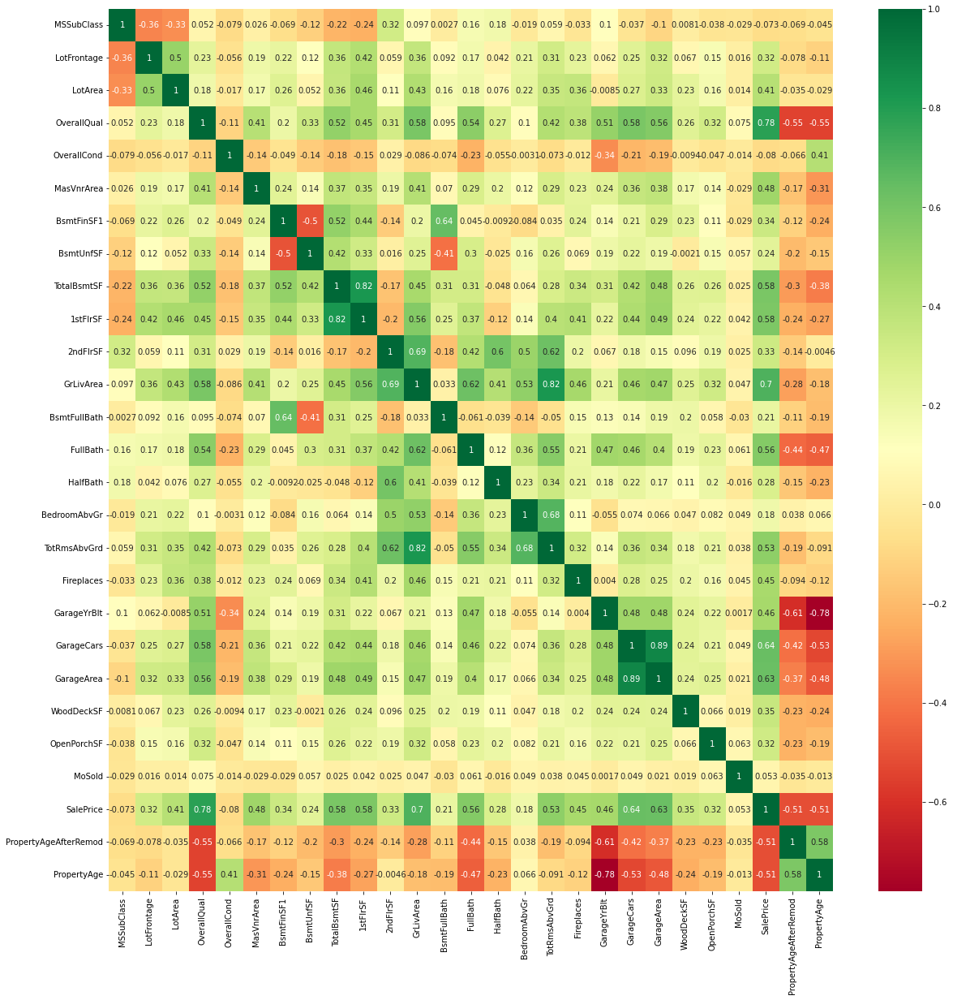

In [39]:
#checking correlation between numeric and boolean variables with SalesPrice
res = house_df.corr()
f, ax = plt.subplots(figsize=(20,20))
ax = sns.heatmap(res, annot=True, cmap='RdYlGn')
plt.show()

In [40]:
#Removing columns that can lead to multicollinearity
house_df = house_df.drop(['MSSubClass','OverallQual','1stFlrSF','2ndFlrSF','BedroomAbvGr','GarageArea','BsmtFinSF1','FullBath','BsmtFullBath','GarageYrBlt','TotRmsAbvGrd','PropertyAge'],axis=1)

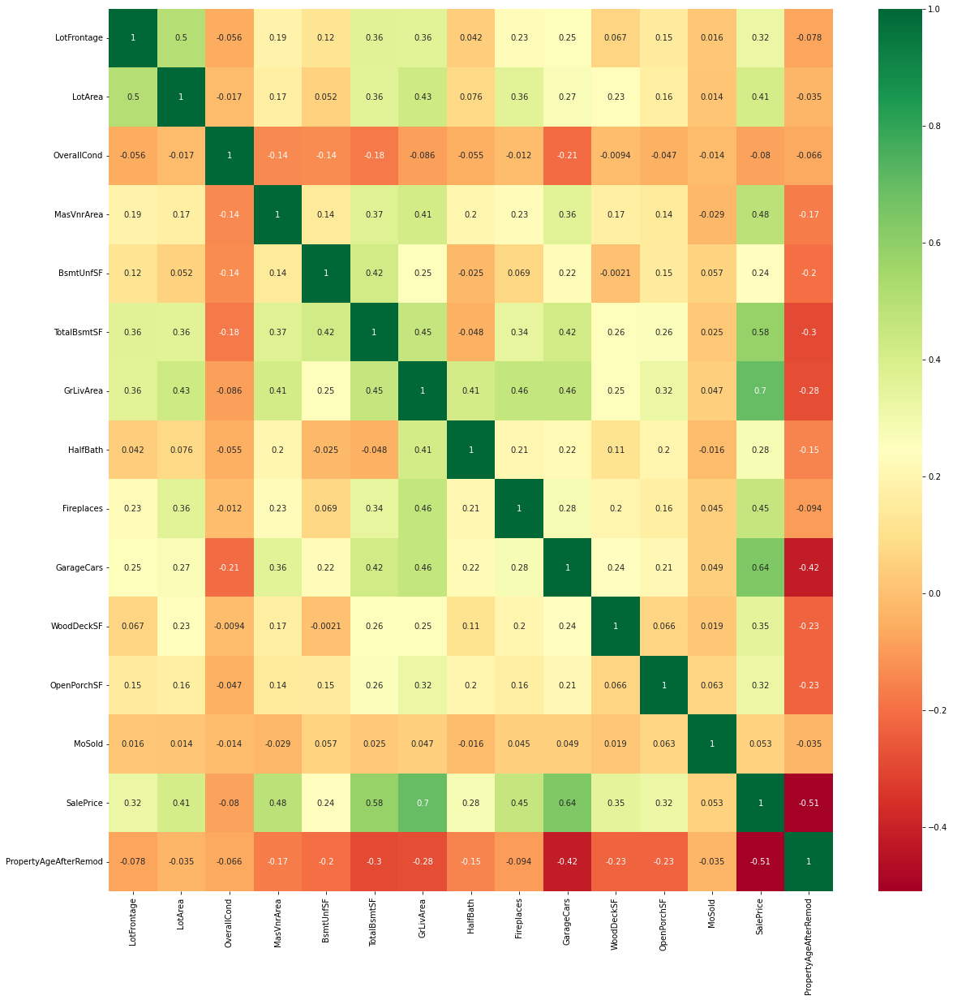

In [41]:
#checking correlation between numeric and boolean variables with SalesPrice
res = house_df.corr()
f, ax = plt.subplots(figsize=(20,20))
ax = sns.heatmap(res, annot=True, cmap='RdYlGn')
plt.show()

Reducing categories by combining the ones having less than 1% records

In [42]:
#Checking for values that are present in < 1% records
cols_to_combine = []
temp = house_df['Exterior1st'].value_counts().reset_index()
temp = temp[temp["Exterior1st"]*100/temp["Exterior1st"].sum() < 1]
for i in temp['index']:
    cols_to_combine.append(i)
cols_to_combine

['CBlock', 'BrkComm', 'AsphShn', 'Stone', 'ImStucc']

In [43]:
#Checking for values that are present in < 1% records
cols_to_combine1 = []
temp = house_df['Exterior2nd'].value_counts().reset_index()
temp = temp[temp["Exterior2nd"]*100/temp["Exterior2nd"].sum() < 1]
for i in temp['index']:
    cols_to_combine1.append(i)
cols_to_combine1

['ImStucc', 'Brk Cmn', 'Stone', 'AsphShn', 'CBlock', 'Other']

In [44]:
#Checking for values that are present in < 1% records
cols_to_combine2 = []
temp = house_df["Neighborhood"].value_counts().reset_index()
temp = temp[temp["Neighborhood"]*100/temp["Neighborhood"].sum() < 1]
for i in temp['index']:
    cols_to_combine2.append(i)
cols_to_combine2

['Veenker', 'NPkVill', 'Blueste']

In [45]:
#Combining categories <1% to other
house_df1 = house_df.copy()
house_df1.Exterior1st = house_df.Exterior1st.replace(cols_to_combine,'Other')
house_df1.Exterior2nd = house_df.Exterior2nd.replace(cols_to_combine1,'Other')
house_df1.Neighborhood = house_df.Neighborhood.replace(cols_to_combine2,'Other')
house_df1.head()

,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtUnfSF,TotalBsmtSF,HeatingQC,GrLivArea,HalfBath,KitchenQual,Fireplaces,GarageType,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,PropertyAgeAfterRemod
0,RL,63.0,13907.0,Reg,Inside,Edwards,1Story,6,Gable,WdShing,Wd Shng,None,0.0,TA,CBlock,TA,No,BLQ,706,996,Ex,996,0,TA,1,Attchd,Unf,0,144,0,7,108000,39
1,RL,78.0,11344.0,Reg,Inside,NAmes,1.5Fin,5,Gable,MetalSd,MetalSd,BrkFace,180.0,TA,CBlock,TA,No,BLQ,414,874,TA,1524,1,TA,0,Attchd,Unf,1,0,0,7,144000,49
2,RL,84.0,14260.0,IR1,FR2,NoRidge,2Story,5,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,Av,GLQ,490,1145,Ex,2198,1,Gd,1,Attchd,RFn,3,192,84,12,250000,8
3,RM,60.0,11340.0,Reg,Inside,OldTown,2Story,6,Gable,VinylSd,AsbShng,None,0.0,TA,PConc,TA,No,Unf,777,777,Gd,2290,0,TA,0,Detchd,Unf,2,0,0,4,122500,60
4,RL,76.0,9591.0,Reg,Inside,NridgHt,2Story,5,Gable,VinylSd,VinylSd,BrkFace,344.0,Gd,PConc,Ex,Av,Unf,1143,1143,Ex,2473,1,Gd,1,BuiltIn,RFn,3,192,151,10,317000,2


In [46]:
house_df1['MoSold'] = house_df1['MoSold'].map({1:'jan',2:'feb',3:'mar',4:'apr',5:'may',6:'june',7:'july',8:'aug',9:'sep',10:'oct',
                                       11:'nov',12:'dec'})
house_df1.head()

,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtUnfSF,TotalBsmtSF,HeatingQC,GrLivArea,HalfBath,KitchenQual,Fireplaces,GarageType,GarageFinish,GarageCars,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,PropertyAgeAfterRemod
0,RL,63.0,13907.0,Reg,Inside,Edwards,1Story,6,Gable,WdShing,Wd Shng,None,0.0,TA,CBlock,TA,No,BLQ,706,996,Ex,996,0,TA,1,Attchd,Unf,0,144,0,july,108000,39
1,RL,78.0,11344.0,Reg,Inside,NAmes,1.5Fin,5,Gable,MetalSd,MetalSd,BrkFace,180.0,TA,CBlock,TA,No,BLQ,414,874,TA,1524,1,TA,0,Attchd,Unf,1,0,0,july,144000,49
2,RL,84.0,14260.0,IR1,FR2,NoRidge,2Story,5,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,Av,GLQ,490,1145,Ex,2198,1,Gd,1,Attchd,RFn,3,192,84,dec,250000,8
3,RM,60.0,11340.0,Reg,Inside,OldTown,2Story,6,Gable,VinylSd,AsbShng,None,0.0,TA,PConc,TA,No,Unf,777,777,Gd,2290,0,TA,0,Detchd,Unf,2,0,0,apr,122500,60
4,RL,76.0,9591.0,Reg,Inside,NridgHt,2Story,5,Gable,VinylSd,VinylSd,BrkFace,344.0,Gd,PConc,Ex,Av,Unf,1143,1143,Ex,2473,1,Gd,1,BuiltIn,RFn,3,192,151,oct,317000,2


In [47]:
# Dropping the first column from the dummies created using 'drop_first = True' to avoid multicollinearity in the model
house_df2 = house_df1.copy()
for i in categorical_col:
    x = pd.get_dummies(house_df2[i], drop_first = True, prefix = i)
    house_df2 = pd.concat([house_df2,x],axis=1)
    house_df2.drop(i,axis=1,inplace=True)
house_df2.head()

,LotFrontage,LotArea,OverallCond,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,HalfBath,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,PropertyAgeAfterRemod,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf
0,63.0,13907.0,6,0.0,706,996,996,0,1,0,144,0,july,108000,39,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1
1,78.0,11344.0,5,180.0,414,874,1524,1,0,1,0,0,july,144000,49,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1
2,84.0,14260.0,5,350.0,490,1145,2198,1,1,3,192,84,dec,250000,8,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0
3,60.0,11340.0,6,0.0,777,777,2290,0,0,2,0,0,apr,122500,60,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1
4,76.0,9591.0,5,344.0,1143,1143,2473,1,1,3,192,151,oct,317000,2,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0


In [48]:
x = pd.get_dummies(house_df2['MoSold'], drop_first = True, prefix = 'MoSold')
house_df2 = pd.concat([house_df2,x],axis=1)
house_df2.drop('MoSold',axis=1,inplace=True)
house_df2.head()

,LotFrontage,LotArea,OverallCond,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,HalfBath,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,PropertyAgeAfterRemod,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Other,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,MoSold_aug,MoSold_dec,MoSold_feb,MoSold_jan,MoSold_july,MoSold_june,MoSold_mar,MoSold_may,MoSold_nov,MoSold_oct,MoSold_sep
0,63.0,13907.0,6,0.0,706,996,996,0,1,0,144,0,108000,39,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
1,78.0,11344.0,5,180.0,414,874,1524,1,0,1,0,0,144000,49,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
2,84.0,14260.0,5,350.0,490,1145,2198,1,1,3,192,84,250000,8,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
3,60.0,11340.0,6,0.0,777,777,2290,0,0,2,0,0,122500,60,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
4,76.0,9591.0,5,344.0,1143,1143,2473,1,1,3,192,151,317000,2,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0


In [49]:
house_df2.shape

(1168, 126)

In [50]:
#checking correlation between numeric and boolean variables with SalesPrice
res = house_df2.corr()
f, ax = plt.subplots(figsize=(160,160))
ax = sns.heatmap(res, annot=True, cmap='RdYlGn')
plt.show()


In [51]:
cols_to_drop = ['LotFrontage','MSZoning_RM','LotShape_Reg','GarageFinish_Unf','Neighborhood_OldTown','Neighborhood_Somerst',
                'RoofStyle_Hip','HouseStyle_1Story','HalfBath','Exterior1st_VinylSd',
                'Exterior1st_BrkFace','Exterior1st_CemntBd','Exterior1st_HdBoard','Exterior1st_MetalSd','Exterior1st_Other','Exterior1st_Plywood',
                'Exterior1st_Stucco','Exterior1st_Wd Sdng','Exterior1st_WdShing','ExterQual_Gd','ExterQual_TA','Foundation_PConc',
                'BsmtExposure_No','KitchenQual_TA','KitchenQual_Gd','MasVnrType_None','BsmtFinType1_GLQ','BsmtFinType1_Unf',
                'GarageType_Detchd','GarageFinish_Unf','HouseStyle_SFoyer','HeatingQC_TA','Foundation_CBlock','GarageType_Attchd','MoSold_june',
                'Exterior2nd_VinylSd','LotConfig_Inside','BsmtQual_Gd']

In [52]:
house_df2.drop(cols_to_drop,axis=1,inplace=True)

In [53]:
#checking correlation between numeric and boolean variables with SalesPrice
res = house_df2.corr()
f, ax = plt.subplots(figsize=(160,160))
ax = sns.heatmap(res, annot=True, cmap='RdYlGn')
plt.show()

Splitting into test and train

In [54]:
# We specify random state so that the train and test data set always have the same rows, respectively

np.random.seed(0)

df_train, df_test = train_test_split(house_df2, train_size = 0.7, test_size = 0.3, random_state = 100)

In [55]:
house_df2.head()

,LotArea,OverallCond,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,PropertyAgeAfterRemod,MSZoning_FV,MSZoning_RH,MSZoning_RL,LotShape_IR2,LotShape_IR3,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_Other,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtFinType1_BLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,KitchenQual_Fa,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageFinish_RFn,MoSold_aug,MoSold_dec,MoSold_feb,MoSold_jan,MoSold_july,MoSold_mar,MoSold_may,MoSold_nov,MoSold_oct,MoSold_sep
0,13907.0,6,0.0,706,996,996,1,0,144,0,108000,39,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,11344.0,5,180.0,414,874,1524,0,1,0,0,144000,49,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,14260.0,5,350.0,490,1145,2198,1,3,192,84,250000,8,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0
3,11340.0,6,0.0,777,777,2290,0,2,0,0,122500,60,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,9591.0,5,344.0,1143,1143,2473,1,3,192,151,317000,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0


In [56]:
numeric_cols = ['LotArea', 'OverallCond','MasVnrArea','BsmtUnfSF','TotalBsmtSF','GrLivArea','Fireplaces','GarageCars', 'WoodDeckSF',
 'OpenPorchSF', 'SalePrice', 'PropertyAgeAfterRemod']

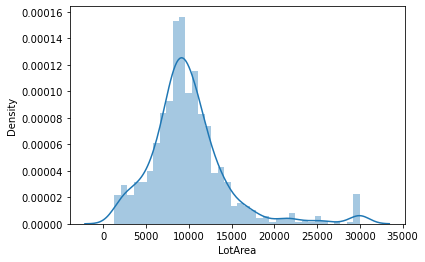

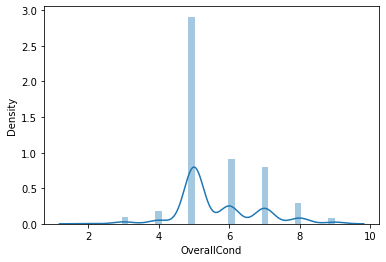

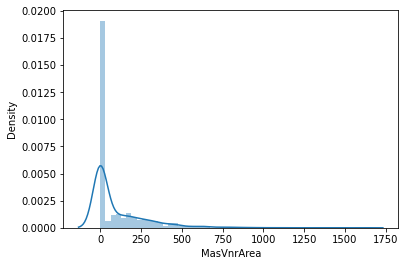

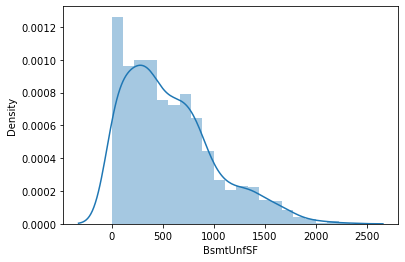

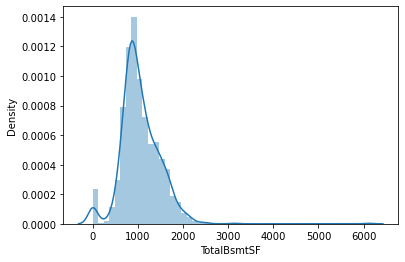

...

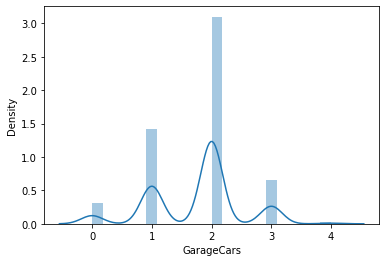

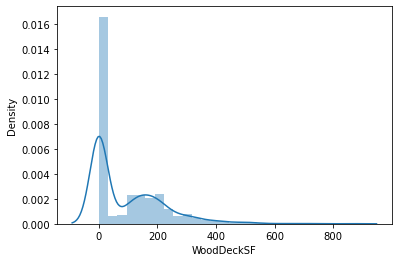

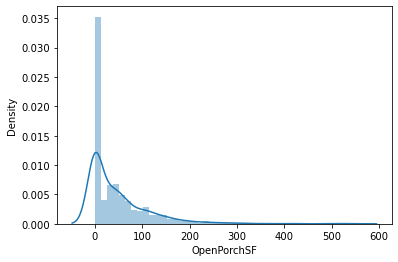

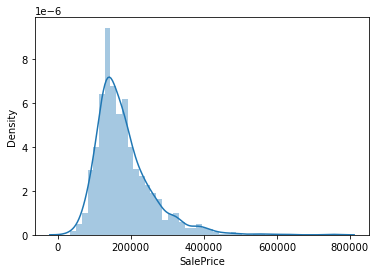

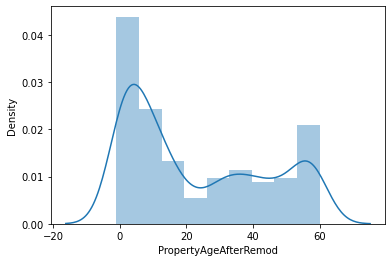

In [57]:
for i in numeric_cols:
    sns.distplot(house_df2[i])
    plt.show()

In [58]:
scaler = StandardScaler()
# Applying scaler() to all the columns except the 'yes-no' and 'dummy' variables
df_train[numeric_cols] = scaler.fit_transform(df_train[numeric_cols])

df_train.head()

,LotArea,OverallCond,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,SalePrice,PropertyAgeAfterRemod,MSZoning_FV,MSZoning_RH,MSZoning_RL,LotShape_IR2,LotShape_IR3,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_Other,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtFinType1_BLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,KitchenQual_Fa,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageFinish_RFn,MoSold_aug,MoSold_dec,MoSold_feb,MoSold_jan,MoSold_july,MoSold_mar,MoSold_may,MoSold_nov,MoSold_oct,MoSold_sep
227,0.194053,-0.547541,1.476497,0.717766,1.811070,0.626298,0.546978,0.325821,0.506083,0.008646,1.010212,-0.966097,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
247,-0.415657,-0.547541,-0.261059,-0.700879,0.594544,-0.332608,0.546978,0.325821,-0.763929,0.239179,-0.013907,-0.339820,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
811,0.117451,-1.417854,-0.093986,2.006601,1.547300,0.406035,-0.952622,-1.046322,0.429112,-0.715885,-0.825222,0.960908,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1097,-0.467208,-0.547541,-0.561790,-1.294299,-0.308188,-1.143406,-0.952622,-1.046322,-0.763929,-0.715885,-0.878423,0.912732,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
91,0.228421,-0.547541,-0.561790,1.128061,2.415923,1.131386,2.046578,0.325821,-0.763929,-0.715885,0.837309,0.912732,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [59]:
#assigning revenue to y_train and the rest of the columns to X_train
y_train = df_train.pop('SalePrice')
X_train = df_train

In [60]:
y_train.head()

227     1.010212
247    -0.013907
811    -0.825222
1097   -0.878423
91      0.837309
Name: SalePrice, dtype: float64

In [61]:
X_train.head()

,LotArea,OverallCond,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,PropertyAgeAfterRemod,MSZoning_FV,MSZoning_RH,MSZoning_RL,LotShape_IR2,LotShape_IR3,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_Other,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtFinType1_BLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,KitchenQual_Fa,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageFinish_RFn,MoSold_aug,MoSold_dec,MoSold_feb,MoSold_jan,MoSold_july,MoSold_mar,MoSold_may,MoSold_nov,MoSold_oct,MoSold_sep
227,0.194053,-0.547541,1.476497,0.717766,1.811070,0.626298,0.546978,0.325821,0.506083,0.008646,-0.966097,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
247,-0.415657,-0.547541,-0.261059,-0.700879,0.594544,-0.332608,0.546978,0.325821,-0.763929,0.239179,-0.339820,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
811,0.117451,-1.417854,-0.093986,2.006601,1.547300,0.406035,-0.952622,-1.046322,0.429112,-0.715885,0.960908,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1097,-0.467208,-0.547541,-0.561790,-1.294299,-0.308188,-1.143406,-0.952622,-1.046322,-0.763929,-0.715885,0.912732,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
91,0.228421,-0.547541,-0.561790,1.128061,2.415923,1.131386,2.046578,0.325821,-0.763929,-0.715885,0.912732,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [62]:
# Running RFE with the output number of the variable equal to 20
lm = LinearRegression()
lm.fit(X_train,y_train)

rfe = RFE(lm, n_features_to_select=20)
rfe.fit(X_train,y_train)

RFE(estimator=LinearRegression(), n_features_to_select=20)

In [63]:
#columns that offer support to prediction
col = X_train.columns[rfe.support_]
col

Index(['GrLivArea', 'GarageCars', 'MSZoning_FV', 'MSZoning_RL', 'LotShape_IR3',
       'Neighborhood_Crawfor', 'Neighborhood_MeadowV', 'Neighborhood_NoRidge',
       'Neighborhood_NridgHt', 'Neighborhood_Other', 'Neighborhood_StoneBr',
       'HouseStyle_2.5Unf', 'Exterior2nd_CmentBd', 'Exterior2nd_Other',
       'Exterior2nd_Stucco', 'ExterQual_Fa', 'Foundation_Wood', 'BsmtQual_Fa',
       'BsmtQual_TA', 'BsmtExposure_Gd'],
      dtype='object')

In [64]:
#columns that don't offer support to prediction
X_train.columns[~rfe.support_]

Index(['LotArea', 'OverallCond', 'MasVnrArea', 'BsmtUnfSF', 'TotalBsmtSF',
       'Fireplaces', 'WoodDeckSF', 'OpenPorchSF', 'PropertyAgeAfterRemod',
       'MSZoning_RH', 'LotShape_IR2', 'LotConfig_CulDSac', 'LotConfig_FR2',
       'LotConfig_FR3', 'Neighborhood_BrDale', 'Neighborhood_BrkSide',
       'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Edwards',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NWAmes', 'Neighborhood_SWISU',
       'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Timber',
       'HouseStyle_1.5Unf', 'HouseStyle_2.5Fin', 'HouseStyle_2Story',
       'HouseStyle_SLvl', 'RoofStyle_Gable', 'RoofStyle_Gambrel',
       'RoofStyle_Mansard', 'RoofStyle_Shed', 'Exterior2nd_BrkFace',
       'Exterior2nd_HdBoard', 'Exterior2nd_MetalSd', 'Exterior2nd_Plywood',
       'Exterior2nd_Wd Sdng', 'Exterior2nd_Wd Shng', 'MasVnrType_BrkFace',
       'MasVnrType_Stone', 'Foundation_

In [65]:
#generic function for calulcatin VIF for a df
def cal_VIF(df):
    vif = pd.DataFrame()
    vif['Features'] = df.columns
    vif['VIF'] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return vif

In [66]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

# Adding a constant variable  
X_train_lm = sm.add_constant(X_train_rfe)

lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

#Summary of linear model 1
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.768
Model:                            OLS   Adj. R-squared:                  0.763
Method:                 Least Squares   F-statistic:                     132.1
Date:                Sun, 15 Jan 2023   Prob (F-statistic):          1.04e-236
Time:                        18:19:01   Log-Likelihood:                -561.72
No. Observations:                 817   AIC:                             1165.
Df Residuals:                     796   BIC:                             1264.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.2026 

In [67]:
#calculation VIF for model 1
cal_VIF(X_train_rfe)

#Observation: alot of features have ViF > 5 

,Features,VIF
3,MSZoning_RL,2.15
18,BsmtQual_TA,2.03
1,GarageCars,1.60
0,GrLivArea,1.48
12,Exterior2nd_CmentBd,1.47
6,Neighborhood_MeadowV,1.38
8,Neighborhood_NridgHt,1.20
5,Neighborhood_Crawfor,1.17
19,BsmtExposure_Gd,1.14
7,Neighborhood_NoRidge,1.14


In [68]:
#removing Foundation_Wood as it has very high ViF
X_train_new = X_train_rfe.drop(['Foundation_Wood'], axis = 1)

In [69]:
# Adding a constant variable 
X_train_lm2 = sm.add_constant(X_train_new)

lm2 = sm.OLS(y_train,X_train_lm2).fit()   # Running the linear model

#Summary of linear model 2
print(lm2.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.768
Model:                            OLS   Adj. R-squared:                  0.763
Method:                 Least Squares   F-statistic:                     138.9
Date:                Sun, 15 Jan 2023   Prob (F-statistic):          1.64e-237
Time:                        18:19:01   Log-Likelihood:                -562.37
No. Observations:                 817   AIC:                             1165.
Df Residuals:                     797   BIC:                             1259.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.2045 

In [70]:
#calculation VIF for model 2
cal_VIF(X_train_new)

#Observation: alot of features have ViF > 5 

,Features,VIF
3,MSZoning_RL,2.15
17,BsmtQual_TA,2.03
1,GarageCars,1.60
0,GrLivArea,1.48
12,Exterior2nd_CmentBd,1.47
6,Neighborhood_MeadowV,1.38
8,Neighborhood_NridgHt,1.20
5,Neighborhood_Crawfor,1.17
18,BsmtExposure_Gd,1.14
7,Neighborhood_NoRidge,1.14


In [71]:
#removing OverallCond as it has very high ViF and is correlated to OverallQual, not removing OverallCond as it is an important factor
X_train_new = X_train_new.drop(['Neighborhood_Other'], axis = 1)

In [72]:
# Adding a constant variable 
X_train_lm_3 = sm.add_constant(X_train_new)

lm3 = sm.OLS(y_train,X_train_lm_3).fit()   # Running the linear model

#Summary of linear model 3
print(lm3.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.768
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                     146.5
Date:                Sun, 15 Jan 2023   Prob (F-statistic):          2.63e-238
Time:                        18:19:02   Log-Likelihood:                -563.07
No. Observations:                 817   AIC:                             1164.
Df Residuals:                     798   BIC:                             1254.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.1982 

In [73]:
#calculation VIF for model 3
cal_VIF(X_train_new)

#Observation: all features ViF < 5 

,Features,VIF
3,MSZoning_RL,2.11
16,BsmtQual_TA,2.01
1,GarageCars,1.59
0,GrLivArea,1.47
11,Exterior2nd_CmentBd,1.47
6,Neighborhood_MeadowV,1.38
8,Neighborhood_NridgHt,1.19
5,Neighborhood_Crawfor,1.17
7,Neighborhood_NoRidge,1.14
17,BsmtExposure_Gd,1.13


In [74]:
#removing OverallCond as it has very high ViF and is correlated to OverallQual, not removing OverallCond as it is an important factor
X_train_new = X_train_new.drop(['ExterQual_Fa'], axis = 1)

In [75]:
# Adding a constant variable 
X_train_lm_4 = sm.add_constant(X_train_new)

lm4 = sm.OLS(y_train,X_train_lm_4).fit()   # Running the linear model

#Summary of linear model 4
print(lm4.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.767
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                     154.4
Date:                Sun, 15 Jan 2023   Prob (F-statistic):          1.10e-238
Time:                        18:19:02   Log-Likelihood:                -564.78
No. Observations:                 817   AIC:                             1166.
Df Residuals:                     799   BIC:                             1250.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.2089 

In [76]:
#calculation VIF for model 4
cal_VIF(X_train_new)

#Observation: all features ViF < 5 

,Features,VIF
3,MSZoning_RL,2.10
15,BsmtQual_TA,2.00
1,GarageCars,1.59
0,GrLivArea,1.47
11,Exterior2nd_CmentBd,1.47
6,Neighborhood_MeadowV,1.38
8,Neighborhood_NridgHt,1.19
5,Neighborhood_Crawfor,1.17
7,Neighborhood_NoRidge,1.14
16,BsmtExposure_Gd,1.13


In [77]:
#removing OverallCond as it has very high ViF and is correlated to OverallQual, not removing OverallCond as it is an important factor
X_train_new = X_train_new.drop(['HouseStyle_2.5Unf'], axis = 1)

In [78]:
# Adding a constant variable 
X_train_lm_5 = sm.add_constant(X_train_new)

lm5 = sm.OLS(y_train,X_train_lm_5).fit()   # Running the linear model

#Summary of linear model 5
print(lm5.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.761
Method:                 Least Squares   F-statistic:                     163.1
Date:                Sun, 15 Jan 2023   Prob (F-statistic):          7.42e-239
Time:                        18:19:02   Log-Likelihood:                -567.02
No. Observations:                 817   AIC:                             1168.
Df Residuals:                     800   BIC:                             1248.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.2275 

**Observation:** 
Model 5 seems to be the best model as r2 and adjusted r2 are 0.76.
P(t) is approximately 0 for all features hence all are significant. VIF for all features is less than 5 hence no multicollieanrity is present.
F-statistic is 163.1 which is greater than 1 and probability of f-statistic is 7.42e-239 which is approximately 0 hence the overall model is significant.

Residual Analysis

In [79]:
#predection using model 5
y_train_pred = lm5.predict(X_train_lm_5)

Text(0.5, 0, 'Errors')

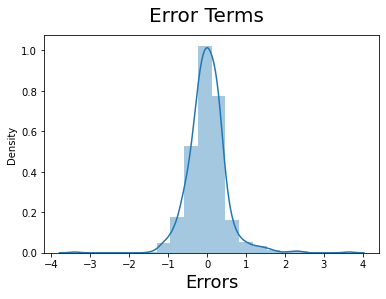

In [80]:
# Plotting the distirbution of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

**Observation:** As we can see from the distribution plot, the error terms are normally distributed with mean as 0.0.

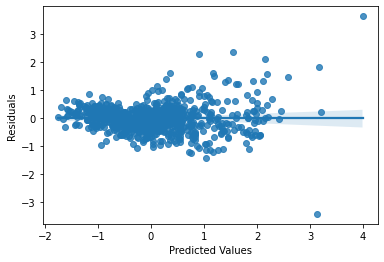

In [81]:
#checking for pattern in error terms
residual = y_train - y_train_pred
sns.regplot(y_train_pred,residual)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

**Observation:** As we can see from the regression plot, there is no visible pattern thus the error terms are independent of each other.

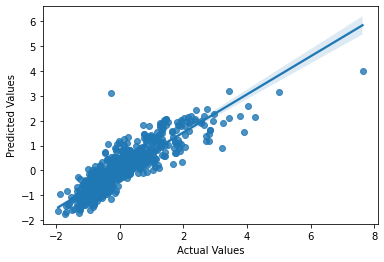

In [82]:
#checking if variance varies along with linearity of model
sns.regplot(y_train,y_train_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

**Observations:** 
*   Constant variance between actual and predicted values. 
*   Actual and Predicted Values have a positive linear relation. The predicted values increase with the increase in the actual values.

Model Predictions

In [83]:
#Scaling the numeric columns in test dataframe
df_test[numeric_cols] = scaler.transform(df_test[numeric_cols])

In [84]:
#Dividing test dataframe into X_test and y_test
y_test = df_test.pop('SalePrice')
X_test = df_test

In [85]:
y_test.head()

588    -0.346413
983    -0.133609
638    -0.114989
266    -0.718820
1010    0.651105
Name: SalePrice, dtype: float64

In [86]:
X_test.head()

,LotArea,OverallCond,MasVnrArea,BsmtUnfSF,TotalBsmtSF,GrLivArea,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,PropertyAgeAfterRemod,MSZoning_FV,MSZoning_RH,MSZoning_RL,LotShape_IR2,LotShape_IR3,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_Other,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_Stone,ExterQual_Fa,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtFinType1_BLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,KitchenQual_Fa,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageFinish_RFn,MoSold_aug,MoSold_dec,MoSold_feb,MoSold_jan,MoSold_july,MoSold_mar,MoSold_may,MoSold_nov,MoSold_oct,MoSold_sep
588,-1.564481,2.063398,-0.561790,0.122028,-0.312735,0.592120,0.546978,-1.046322,-0.763929,-0.715885,-0.917921,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
983,-0.342989,0.322772,0.162192,0.212432,-0.903945,0.094627,0.546978,0.325821,-0.763929,0.107446,0.286456,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
638,-0.400751,-0.547541,-0.561790,0.914800,-0.214958,0.284510,0.546978,0.325821,0.005775,-0.057220,-0.821571,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0
266,-0.654159,2.063398,-0.561790,-0.411123,-0.017131,-0.900357,-0.952622,-1.046322,-0.763929,0.996644,-1.110622,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1010,-0.399923,-0.547541,1.081092,0.254157,1.379033,0.265522,-0.952622,1.697963,-0.763929,1.523575,-0.917921,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [87]:
# Creating X_test_new dataframe by dropping variables from X_test based on the final features in model selected
X_test_new = X_test[X_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

# Making predictions
y_pred = lm5.predict(X_test_new)

In [88]:
#calculating r2 for test data
r2 = r2_score(y_test, y_pred) 
round(r2,2)

0.77

In [89]:
#calculating adjusted r2 for test data
#adjusted_r2 = 1 - (1-r2)*(n-1)/(n-p-1) where n is sample size and p is number of independent variables
adjustedr2 = round(1-(1-r2)*(X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1),2)
print(adjustedr2)

0.69


**Observation:** 
*   R2 for test data : 0.77
*   Adjusted R2 for test data: 0.69





Final Interpration of Model and Conclusion

In [101]:
lm5.params

const                  -0.227547
GrLivArea               0.428179
GarageCars              0.224700
MSZoning_FV             0.352623
MSZoning_RL             0.288007
LotShape_IR3           -0.438602
Neighborhood_Crawfor    0.506904
Neighborhood_MeadowV   -0.809866
Neighborhood_NoRidge    0.792833
Neighborhood_NridgHt    0.821202
Neighborhood_StoneBr    1.117500
Exterior2nd_CmentBd     0.512671
Exterior2nd_Other      -0.467230
Exterior2nd_Stucco     -0.396632
BsmtQual_Fa            -0.362034
BsmtQual_TA            -0.309127
BsmtExposure_Gd         0.477998
dtype: float64

<b>Observation:</b> The demand is positively influenced by GrLivArea, GarageCars, MSZoning_FV, MSZoning_RL, Neighborhood_Crawfor, Neighborhood_NoRidge, Neighborhood_NridgHt, Neighborhood_StoneBr, Exterior2nd_CmentBd and BsmtExposure_Gd<br>
The demand is negatively influenced by LotShape_IR3, Neighborhood_MeadowV, Exterior2nd_Other, Exterior2nd_Stucco, 
BsmtQual_Fa and BsmtQual_TA

**Final Linear Regression Equation:**
SalePrice = -0.227547 * const + 0.428179 * GrLivArea + 0.224700 * GarageCars + 0.3526231 * MSZoning_FV + 0.288007 * MSZoning_RL - 0.438602 * LotShapeIR3 + 0.506904 * Neighborhood_Crawfor - 0.809866 * Neighborhood_MeadowV + 0.792833 * NeighborhoodNoRidge + 0.821202 * Neighborhood_NridgHt + 1.117500 * Neighborhood_StoneBr  + 0.512671 * Exterior2nd_CemntBd - 0.467230 * Exterior2nd_Other - 0.396632 * Exterior2nd_Stucco - 0.362034 * BsmtQual_Fa - 0.309127 * BsmtQual_TA + 0.477998 * BsmtQual_Gd 

**Conclusion**: 

*  Model 5 is considered to be the best model with adjusted r2 value of 0.76 for train data and 0.69 for test data.
*   The model is also satisfying the assumptions of linear regression.
*   The demand of bike is influenced by the following factors: GrLivArea, GarageCars, MSZoning_FV, MSZoning_RL, Neighborhood_Crawfor, Neighborhood_NoRidge, Neighborhood_NridgHt, Neighborhood_StoneBr,  Exterior2nd_CmentBd, BsmtExposure_Gd, LotShape_IR3, Neighborhood_MeadowV, Exterior2nd_Other, Exterior2nd_Stucco,BsmtQual_Fa and BsmtQual_TA

